Available unit IDs: ['unit_11', 'unit_17', 'unit_33', 'unit_42', 'unit_52', 'unit_59', 'unit_65', 'unit_69', 'unit_71', 'unit_140', 'unit_154', 'unit_161', 'unit_165', 'unit_175', 'unit_180', 'unit_191', 'unit_194', 'unit_333', 'unit_338', 'unit_343', 'unit_345', 'unit_346', 'unit_347', 'unit_348', 'unit_367', 'unit_368']


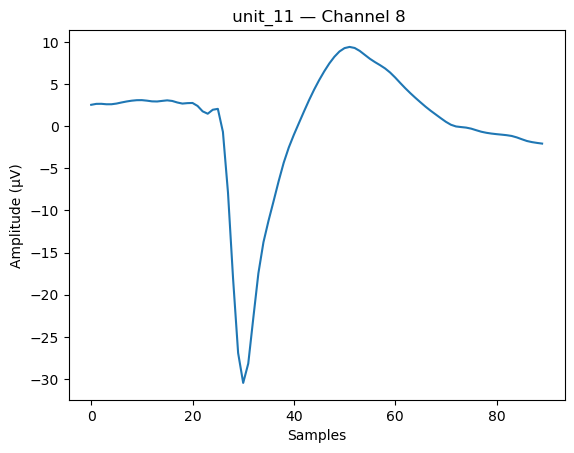

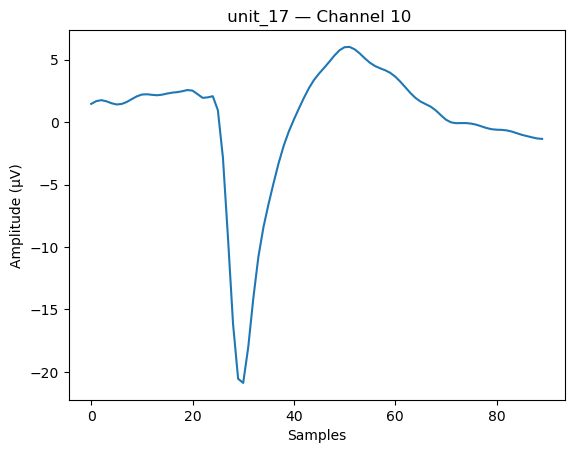

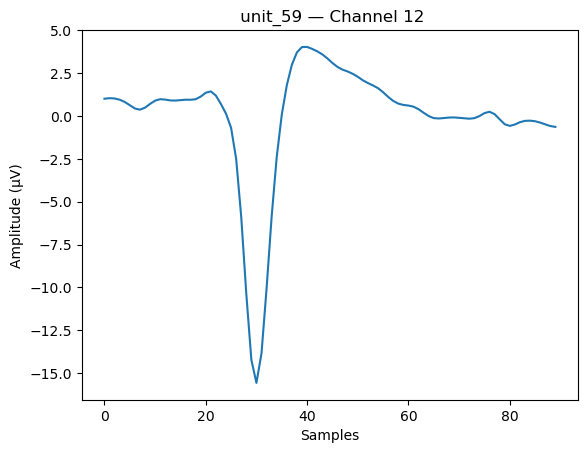

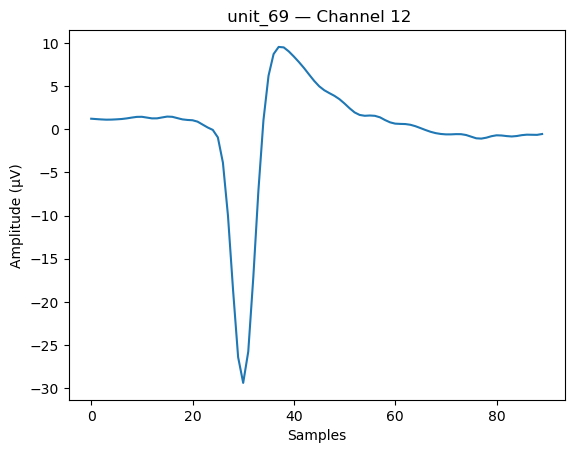

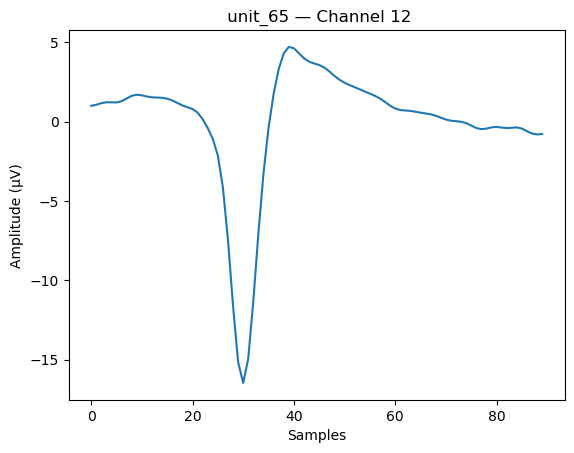

...

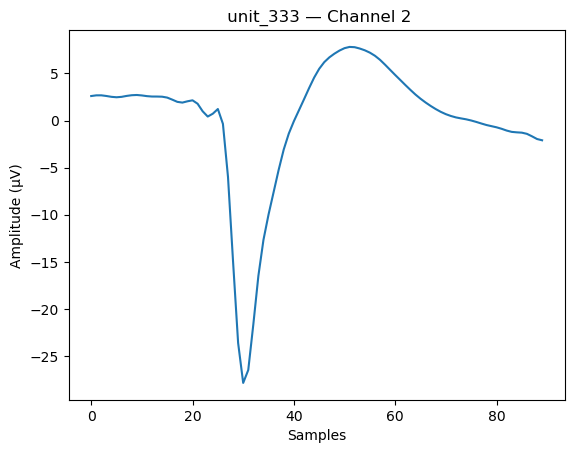

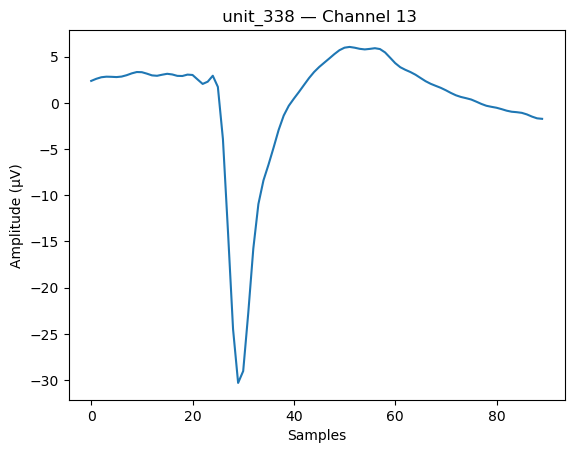

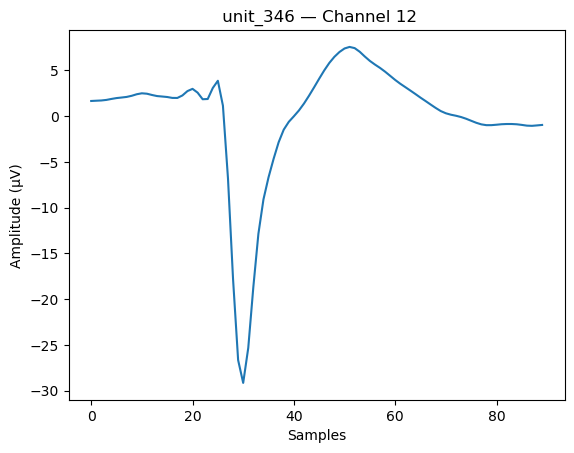

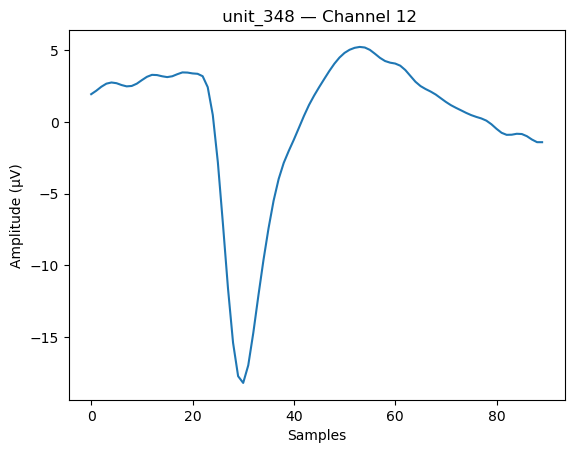

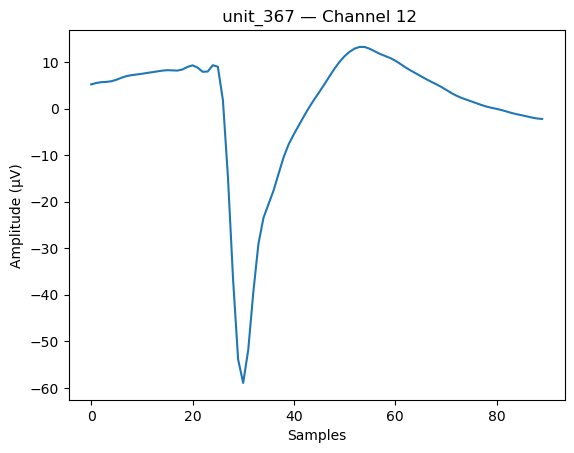

In [12]:
import numpy as np

# Load the file
data = np.load('C:/Users/rache/OneDrive/桌面/mean_waveform_dict051625.npz', allow_pickle=True)

# Convert to dictionary
mean_waveform_dict = {k: data[k] for k in data}

# Access example unit (e.g., unit 0 if it exists)
unit_ids = list(mean_waveform_dict.keys())
print(f"Available unit IDs: {unit_ids}")

selected_units = ['unit_11', 'unit_17','unit_59','unit_69','unit_65','unit_71','unit_140','unit_154','unit_161','unit_165','unit_333','unit_338','unit_346','unit_348','unit_367']
mean_waveform_dict = {unit: data[unit] for unit in selected_units if unit in data}

# Example: plot waveform for unit 0
import matplotlib.pyplot as plt

for unit_id in mean_waveform_dict:
    mean_waveform = mean_waveform_dict[unit_id]  # shape: (n_samples, n_channels)
    
    # Pick best channel to plot
    best_channel = best_channel = np.ptp(mean_waveform, axis=0).argmax()
    
    plt.plot(mean_waveform[:, best_channel])
    plt.title(f" {unit_id} — Channel {best_channel}")
    plt.xlabel("Samples")
    plt.ylabel("Amplitude (µV)")
    plt.show()


In [13]:
import numpy as np
import os

# === SETTINGS ===
# You can use either (path, [units]) tuples OR plain path strings (which will load all units).
datasets = [
    ('C:/Users/rache/OneDrive/桌面/mean_waveform_dict051625.npz',
     ['unit_11','unit_17','unit_59','unit_69','unit_65','unit_71','unit_140','unit_154','unit_161','unit_165','unit_333','unit_338','unit_346','unit_348','unit_367']),
    ("C:/Users/rache/OneDrive/桌面/mean_waveform_dict031925.npz", ['unit_334','unit_335','unit_339']),
    ("C:/Users/rache/OneDrive/桌面/mean_waveform_dict040125.npz", ['unit_29','unit_41','unit_75']),
    ("C:/Users/rache/OneDrive/桌面/mean_waveform_dict070125.npz", ['unit_194','unit_204','unit_206','unit_208','unit_211','unit_226','unit_235','unit_284','unit_311']),
    ("C:/Users/rache/OneDrive/桌面/mean_waveform_dict061925.npz", ['unit_34','unit_184','unit_186','unit_187']),
    # You may either supply units here...
    # ("C:/Users/rache/OneDrive/桌面/mean_waveform_dict082825.npz", ['unit_XXX']),
    # ...or just put the path alone to load all units from that file:
    "C:/Users/rache/OneDrive/桌面/mean_waveform_dict082825.npz"
]

mean_waveform_dict = {}

# === LOADING ===
for entry in datasets:
    # support either (path, units_list) or 'path' string
    if isinstance(entry, (tuple, list)) and len(entry) == 2:
        file_path, units_to_load = entry
    elif isinstance(entry, str):
        file_path = entry
        units_to_load = None   # None means "load all available units"
    else:
        print("Skipping invalid dataset entry:", entry)
        continue

    if not os.path.exists(file_path):
        print(f"⚠️ Skipping {file_path} — file not found.")
        continue

    data = np.load(file_path, allow_pickle=True)
    available_units = list(data.keys())
    print(f"\nLoaded {file_path}")
    print("Available units:", available_units)

    # decide which units to iterate
    if units_to_load is None:
        units_iter = available_units
    else:
        units_iter = units_to_load

    base = os.path.basename(file_path).replace('.npz','')
    for unit in units_iter:
        if unit in data:
            arr = data[unit]
            # unwrap 0-d object arrays if necessary (some .npz saving styles produce this)
            if isinstance(arr, np.ndarray) and arr.ndim == 0:
                try:
                    arr = arr.item()
                except Exception:
                    pass
            # prefix with filename to avoid overwriting same unit names across files
            key = f"{base}_{unit}"
            mean_waveform_dict[key] = arr
        else:
            print(f"⚠️ Unit {unit} not found in {file_path}")

print(f"\nTotal units loaded: {len(mean_waveform_dict)}")
print(list(mean_waveform_dict.keys()))



Loaded C:/Users/rache/OneDrive/桌面/mean_waveform_dict051625.npz
Available units: ['unit_11', 'unit_17', 'unit_33', 'unit_42', 'unit_52', 'unit_59', 'unit_65', 'unit_69', 'unit_71', 'unit_140', 'unit_154', 'unit_161', 'unit_165', 'unit_175', 'unit_180', 'unit_191', 'unit_194', 'unit_333', 'unit_338', 'unit_343', 'unit_345', 'unit_346', 'unit_347', 'unit_348', 'unit_367', 'unit_368']

Loaded C:/Users/rache/OneDrive/桌面/mean_waveform_dict031925.npz
Available units: ['unit_2', 'unit_21', 'unit_63', 'unit_84', 'unit_182', 'unit_183', 'unit_184', 'unit_192', 'unit_193', 'unit_194', 'unit_195', 'unit_200', 'unit_201', 'unit_205', 'unit_334', 'unit_335', 'unit_339']

Loaded C:/Users/rache/OneDrive/桌面/mean_waveform_dict040125.npz
Available units: ['unit_29', 'unit_41', 'unit_75', 'unit_76']

Loaded C:/Users/rache/OneDrive/桌面/mean_waveform_dict070125.npz
Available units: ['unit_56', 'unit_62', 'unit_87', 'unit_117', 'unit_136', 'unit_148', 'unit_149', 'unit_150', 'unit_155', 'unit_158', 'unit_161

In [14]:
import numpy as np

def extract_waveform_features(mean_waveform_dict, sampling_rate=30000):
    features = {}
    for unit_id, waveform in mean_waveform_dict.items():
        # Select best channel (largest peak-to-peak amplitude)
        best_channel = np.ptp(waveform, axis=0).argmax()
        wf = waveform[:, best_channel]  # shape: (n_samples,)

        # Find trough (minimum)
        trough_idx = np.argmin(wf)
        trough_val = wf[trough_idx]

        # Post-trough peak (positive-going)
        post_trough = wf[trough_idx:]
        if len(post_trough) > 1:
            peak_idx_relative = np.argmax(post_trough)
            peak_idx = trough_idx + peak_idx_relative
            peak_val = wf[peak_idx]
        else:
            peak_idx = trough_idx
            peak_val = wf[trough_idx]

        # Trough-to-peak time (in ms)
        ttp_ms = (peak_idx - trough_idx) / sampling_rate * 1000

        # Half-width (width of trough at half-minimum amplitude)
        half_min = trough_val / 2
        left = np.where(wf[:trough_idx] > half_min)[0]
        right = np.where(wf[trough_idx:] > half_min)[0]
        if left.size > 0 and right.size > 0:
            half_width_idx = right[0] + trough_idx - left[-1]
            half_width_ms = half_width_idx / sampling_rate * 1000
        else:
            half_width_ms = np.nan

        # Peak-to-trough ratio
        peak_trough_ratio = abs(peak_val / trough_val) if trough_val != 0 else np.nan

        # Calculate sample offset for 0.5 ms after trough
        offset_samples = int(round(0.5 * sampling_rate / 1000))
        slope_idx = trough_idx + offset_samples

        if 1 <= slope_idx < len(wf) - 1:
            # Central difference: (f(x+1) - f(x-1)) / (2*dt), convert to µV/ms
            dt = 1 / sampling_rate  # seconds per sample
            slope = (wf[slope_idx + 1] - wf[slope_idx - 1]) / (2 * dt) / 1000  # µV/ms
        else:
            slope = np.nan  # Not enough data on either side for derivative

        
        features[unit_id] = {
            'ttp_ms': ttp_ms,
            'half_width_ms': half_width_ms,
            'peak_trough_ratio': peak_trough_ratio,
            'slope_0.5ms': slope,
        }

    return features

In [15]:
features = extract_waveform_features(mean_waveform_dict)
features  # This should output a dictionary

{'mean_waveform_dict051625_unit_11': {'ttp_ms': np.float64(0.7),
  'half_width_ms': np.float64(0.23333333333333334),
  'peak_trough_ratio': np.float32(0.3084951),
  'slope_0.5ms': np.float32(32.601963)},
 'mean_waveform_dict051625_unit_17': {'ttp_ms': np.float64(0.7),
  'half_width_ms': np.float64(0.23333333333333334),
  'peak_trough_ratio': np.float32(0.28797123),
  'slope_0.5ms': np.float32(14.508029)},
 'mean_waveform_dict051625_unit_59': {'ttp_ms': np.float64(0.3333333333333333),
  'half_width_ms': np.float64(0.2),
  'peak_trough_ratio': np.float32(0.25934452),
  'slope_0.5ms': np.float32(-7.4704742)},
 'mean_waveform_dict051625_unit_69': {'ttp_ms': np.float64(0.23333333333333334),
  'half_width_ms': np.float64(0.2),
  'peak_trough_ratio': np.float32(0.32441768),
  'slope_0.5ms': np.float32(-16.336449)},
 'mean_waveform_dict051625_unit_65': {'ttp_ms': np.float64(0.3),
  'half_width_ms': np.float64(0.2),
  'peak_trough_ratio': np.float32(0.28603584),
  'slope_0.5ms': np.float32(-3.8

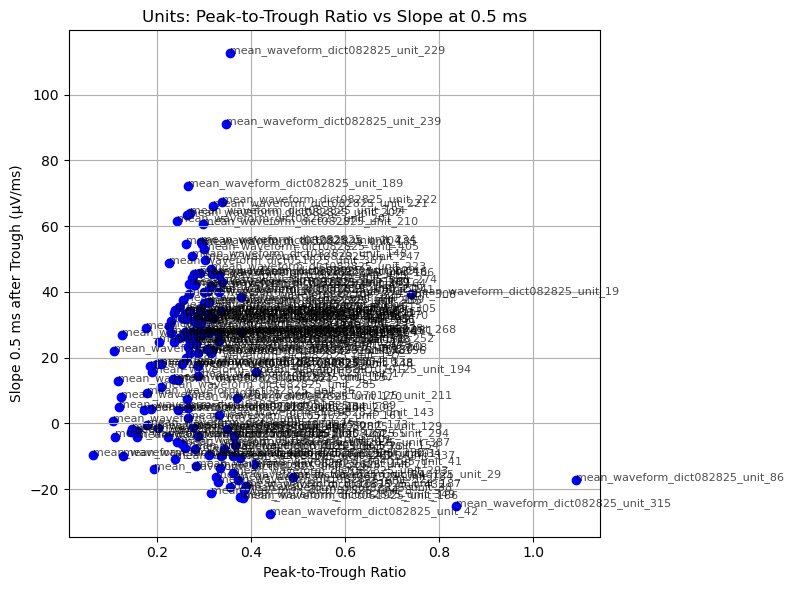

In [16]:
import matplotlib.pyplot as plt
import numpy as np

# Units you want to exclude
exclude_units = {"mean_waveform_dict082825_unit_23","mean_waveform_dict082825_unit_433","mean_waveform_dict082825_unit_431"}  # just add unit IDs you want to skip

# Extract lists of x, y, and labels
x = []
y = []
labels = []

for unit_id, vals in features.items():
    # Skip excluded units
    if unit_id in exclude_units:
        continue

    # Only plot units with valid data (not NaN)
    if not (np.isnan(vals['peak_trough_ratio']) or np.isnan(vals['slope_0.5ms'])):
        x.append(vals['peak_trough_ratio'])
        y.append(vals['slope_0.5ms'])
        labels.append(unit_id)

plt.figure(figsize=(8,6))
plt.scatter(x, y, color='blue')

# Optional: label each point with unit_id
for i, label in enumerate(labels):
    plt.text(x[i], y[i], label, fontsize=8, alpha=0.7)

plt.xlabel("Peak-to-Trough Ratio")
plt.ylabel("Slope 0.5 ms after Trough (µV/ms)")
plt.title("Units: Peak-to-Trough Ratio vs Slope at 0.5 ms")
plt.grid(True)
plt.tight_layout()
plt.show()




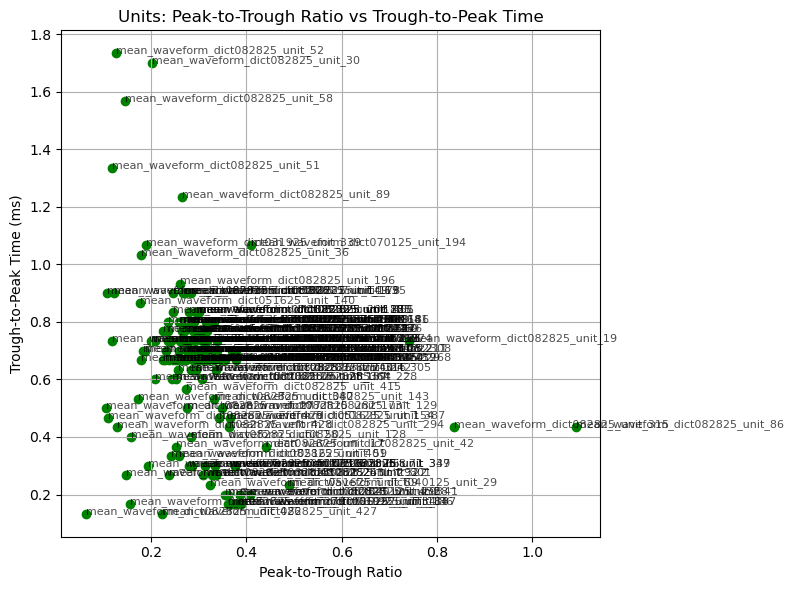

In [7]:
import matplotlib.pyplot as plt
import numpy as np

# Units to exclude
exclude_units = {"mean_waveform_dict082825_unit_23","mean_waveform_dict082825_unit_433","mean_waveform_dict082825_unit_431"}

# Extract data for plotting
x = []
y = []
labels = []

for unit_id, vals in features.items():
    if (
        unit_id not in exclude_units
        and not (np.isnan(vals['peak_trough_ratio']) or np.isnan(vals['ttp_ms']))
    ):
        x.append(vals['peak_trough_ratio'])
        y.append(vals['ttp_ms'])
        labels.append(unit_id)

plt.figure(figsize=(8,6))
plt.scatter(x, y, color='green')

# Label points with unit IDs
for i, label in enumerate(labels):
    plt.text(x[i], y[i], label, fontsize=8, alpha=0.7)

plt.xlabel("Peak-to-Trough Ratio")
plt.ylabel("Trough-to-Peak Time (ms)")
plt.title("Units: Peak-to-Trough Ratio vs Trough-to-Peak Time")
plt.grid(True)
plt.tight_layout()
plt.show()


C:\Users\rache\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


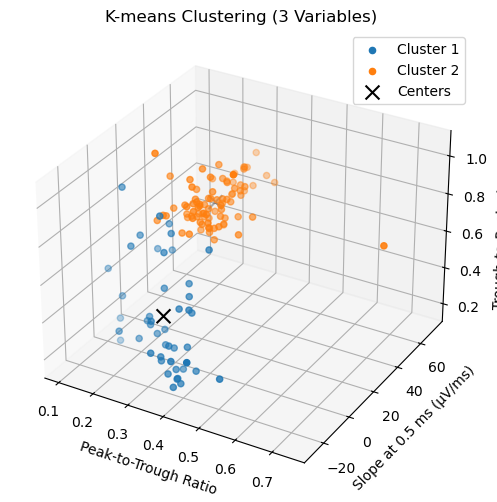

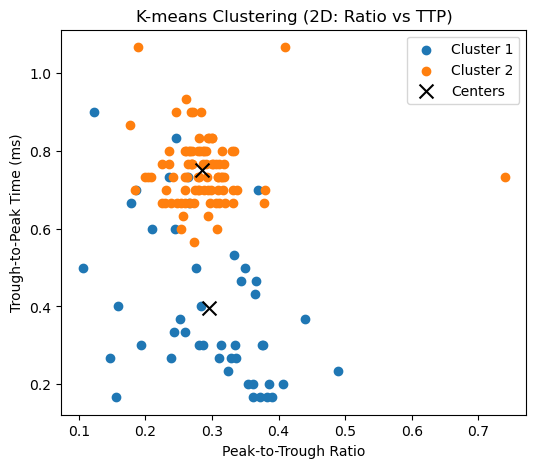

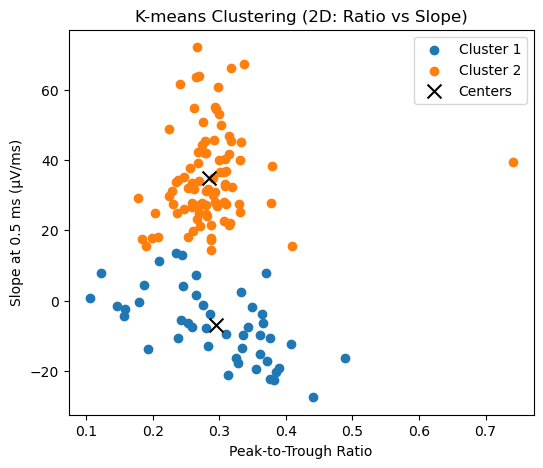

mean_waveform_dict051625_unit_11: Cluster 2
mean_waveform_dict051625_unit_17: Cluster 2
mean_waveform_dict051625_unit_59: Cluster 1
mean_waveform_dict051625_unit_69: Cluster 1
mean_waveform_dict051625_unit_65: Cluster 1
mean_waveform_dict051625_unit_71: Cluster 1
mean_waveform_dict051625_unit_140: Cluster 2
mean_waveform_dict051625_unit_154: Cluster 1
mean_waveform_dict051625_unit_161: Cluster 1
mean_waveform_dict051625_unit_165: Cluster 2
mean_waveform_dict051625_unit_333: Cluster 2
mean_waveform_dict051625_unit_338: Cluster 2
mean_waveform_dict051625_unit_346: Cluster 2
mean_waveform_dict051625_unit_348: Cluster 2
mean_waveform_dict051625_unit_367: Cluster 2
mean_waveform_dict031925_unit_334: Cluster 2
mean_waveform_dict031925_unit_335: Cluster 2
mean_waveform_dict031925_unit_339: Cluster 2
mean_waveform_dict040125_unit_29: Cluster 1
mean_waveform_dict040125_unit_41: Cluster 1
mean_waveform_dict040125_unit_75: Cluster 1
mean_waveform_dict070125_unit_194: Cluster 2
mean_waveform_dict0

In [17]:
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # enables 3D plotting

# Units to exclude from clustering
exclude_units = {
    "mean_waveform_dict082825_unit_23","mean_waveform_dict082825_unit_433","mean_waveform_dict082825_unit_431",
    "mean_waveform_dict082825_unit_30","mean_waveform_dict082825_unit_36","mean_waveform_dict082825_unit_51",
    "mean_waveform_dict082825_unit_52","mean_waveform_dict082825_unit_58","mean_waveform_dict082825_unit_86",
    "mean_waveform_dict082825_unit_89","mean_waveform_dict082825_unit_190","mean_waveform_dict082825_unit_229",
    "mean_waveform_dict082825_unit_239","mean_waveform_dict082825_unit_274","mean_waveform_dict082825_unit_305",
    "mean_waveform_dict082825_unit_315","mean_waveform_dict082825_unit_316","mean_waveform_dict082825_unit_321",
    "mean_waveform_dict082825_unit_340","mean_waveform_dict082825_unit_350","mean_waveform_dict082825_unit_426",
    "mean_waveform_dict082825_unit_427","mean_waveform_dict082825_unit_428","mean_waveform_dict082825_unit_429",
    "mean_waveform_dict082825_unit_430"
}

# === Prepare data ===
unit_ids = [u for u in features.keys() if u not in exclude_units]
X = np.array([[features[u]['peak_trough_ratio'],
               features[u]['slope_0.5ms'],
               features[u]['ttp_ms']] for u in unit_ids])

# === K-means clustering (2 groups, change k as needed) ===
k = 2
kmeans = KMeans(n_clusters=k, random_state=0, n_init=10).fit(X)
labels = kmeans.labels_
centers = kmeans.cluster_centers_

# Colors
colors = ['tab:blue', 'tab:orange', 'tab:green', 'tab:red', 'tab:purple']

# === 3D plot (all three variables) ===
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')

for cluster_id in range(k):
    cluster_points = X[labels == cluster_id]
    ax.scatter(cluster_points[:, 0], cluster_points[:, 1], cluster_points[:, 2],
               label=f"Cluster {cluster_id+1}", color=colors[cluster_id % len(colors)])

ax.scatter(centers[:, 0], centers[:, 1], centers[:, 2],
           c='black', marker='x', s=100, label="Centers")

ax.set_xlabel("Peak-to-Trough Ratio")
ax.set_ylabel("Slope at 0.5 ms (µV/ms)")
ax.set_zlabel("Trough-to-Peak Time (ms)")
ax.set_title("K-means Clustering (3 Variables)")
ax.legend()
plt.show()

# === 2D plot: Peak-to-Trough Ratio vs Trough-to-Peak Time ===
plt.figure(figsize=(6, 5))
for cluster_id in range(k):
    cluster_points = X[labels == cluster_id]
    plt.scatter(cluster_points[:, 0], cluster_points[:, 2],
                label=f"Cluster {cluster_id+1}", color=colors[cluster_id % len(colors)])
plt.scatter(centers[:, 0], centers[:, 2], c='black', marker='x', s=100, label="Centers")
plt.xlabel("Peak-to-Trough Ratio")
plt.ylabel("Trough-to-Peak Time (ms)")
plt.title("K-means Clustering (2D: Ratio vs TTP)")
plt.legend()
plt.show()

# === 2D plot: Peak-to-Trough Ratio vs Slope 0.5 ms ===
plt.figure(figsize=(6, 5))
for cluster_id in range(k):
    cluster_points = X[labels == cluster_id]
    plt.scatter(cluster_points[:, 0], cluster_points[:, 1],
                label=f"Cluster {cluster_id+1}", color=colors[cluster_id % len(colors)])
plt.scatter(centers[:, 0], centers[:, 1], c='black', marker='x', s=100, label="Centers")
plt.xlabel("Peak-to-Trough Ratio")
plt.ylabel("Slope at 0.5 ms (µV/ms)")
plt.title("K-means Clustering (2D: Ratio vs Slope)")
plt.legend()
plt.show()

# === Print cluster membership ===
for unit, label in zip(unit_ids, labels):
    print(f"{unit}: Cluster {label+1}")


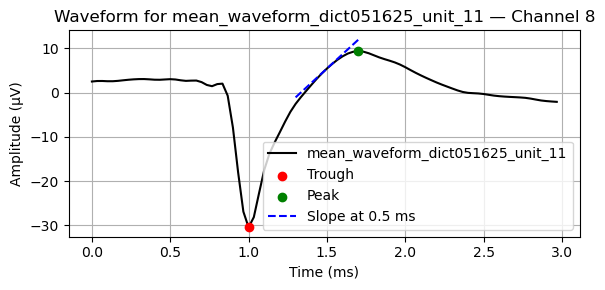

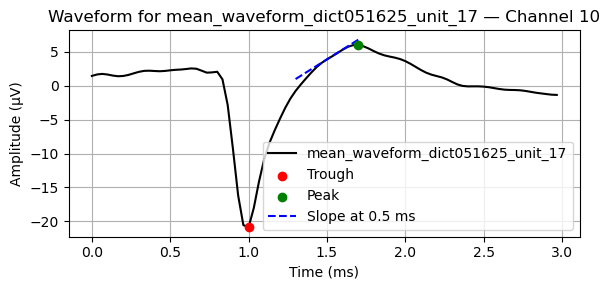

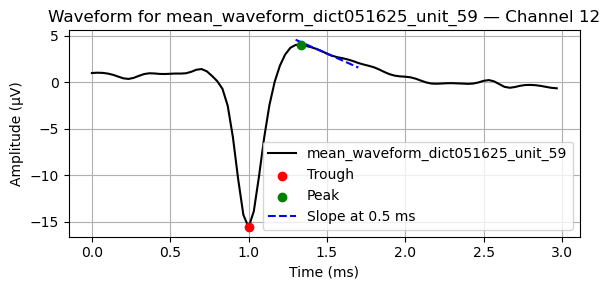

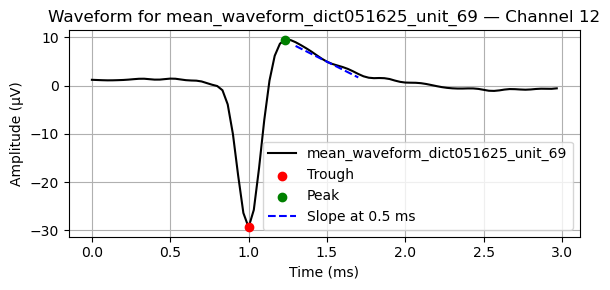

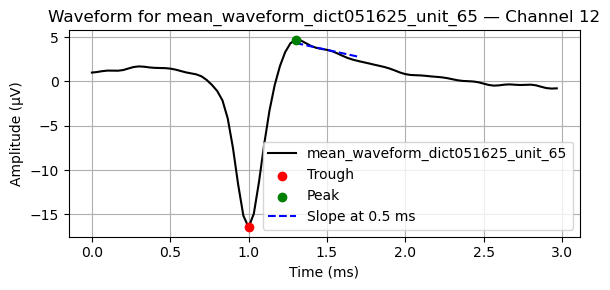

...

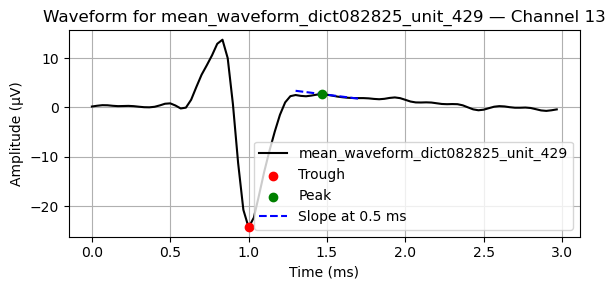

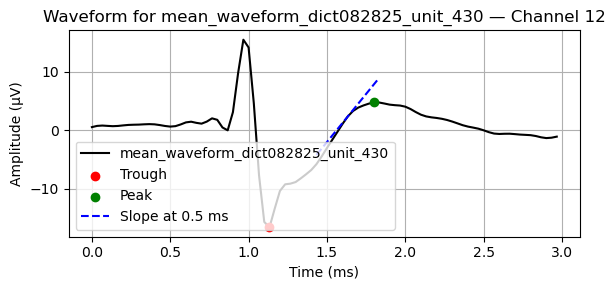

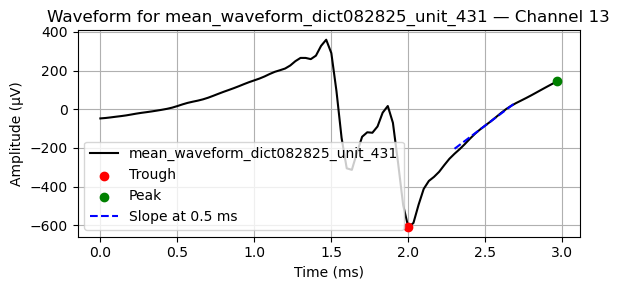

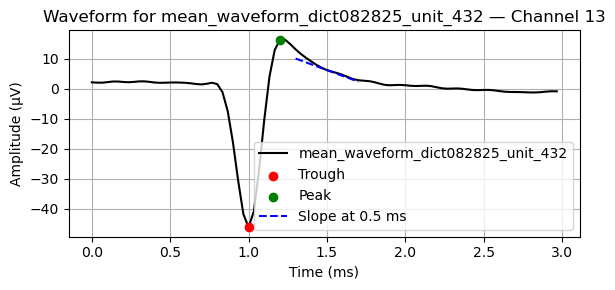

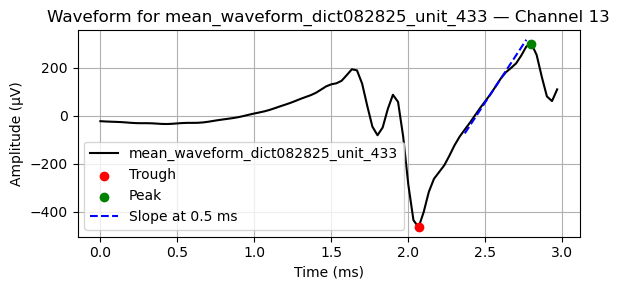

C:\Users\rache\anaconda3\Lib\site-packages\openpyxl\workbook\child.py:99: UserWarning: Title is more than 31 characters. Some applications may not be able to read the file
  warnings.warn("Title is more than 31 characters. Some applications may not be able to read the file")


Waveforms exported to waveforms.xlsx


In [10]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

sampling_rate = 30000  # in Hz
samples_per_ms = sampling_rate / 1000  # 30 samples per ms

# Dictionary to collect data for Excel
export_data = {}

for unit_id, waveform in mean_waveform_dict.items():
    if waveform.ndim != 2:
        continue

    best_channel = np.ptp(waveform, axis=0).argmax()
    wf = waveform[:, best_channel]  # shape: (n_samples,)

    # Time axis in milliseconds
    time_axis = np.arange(len(wf)) / sampling_rate * 1000  # ms

    # Save this unit’s waveform as DataFrame
    df = pd.DataFrame({
        "Time_ms": time_axis,
        f"{unit_id}_Amplitude_uV": wf
    })

    # Store for export
    export_data[unit_id] = df

    # Plot (optional, same as before)
    trough_idx = np.argmin(wf)
    trough_val = wf[trough_idx]
    trough_time = trough_idx / sampling_rate * 1000

    post_trough = wf[trough_idx:]
    if len(post_trough) > 1:
        peak_idx_relative = np.argmax(post_trough)
        peak_idx = trough_idx + peak_idx_relative
        peak_val = wf[peak_idx]
    else:
        peak_idx = trough_idx
        peak_val = wf[trough_idx]
    peak_time = peak_idx / sampling_rate * 1000

    offset_samples = int(0.5 * samples_per_ms)
    slope_idx = trough_idx + offset_samples
    if slope_idx + 1 >= len(wf) or slope_idx - 1 < 0:
        continue

    slope_uv_per_ms = (wf[slope_idx + 1] - wf[slope_idx - 1]) / (2 / samples_per_ms)
    tangent_center_time = slope_idx / sampling_rate * 1000
    tangent_x_ms = np.array([-0.2, 0.2]) + tangent_center_time
    tangent_y = wf[slope_idx] + slope_uv_per_ms * (tangent_x_ms - tangent_center_time)

    plt.figure(figsize=(6, 3))
    plt.plot(time_axis, wf, label=f'{unit_id}', color='black')
    plt.scatter(trough_time, trough_val, color='red', label='Trough', zorder=5)
    plt.scatter(peak_time, peak_val, color='green', label='Peak', zorder=5)
    plt.plot(tangent_x_ms, tangent_y, color='blue', linestyle='--', label='Slope at 0.5 ms')
    plt.title(f"Waveform for {unit_id} — Channel {best_channel}")
    plt.xlabel("Time (ms)")
    plt.ylabel("Amplitude (µV)")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# ---- Export all waveforms to Excel ----
output_file = "waveforms.xlsx"
with pd.ExcelWriter(output_file, engine="openpyxl") as writer:
    for unit_id, df in export_data.items():
        df.to_excel(writer, sheet_name=str(unit_id), index=False)

print(f"Waveforms exported to {output_file}")


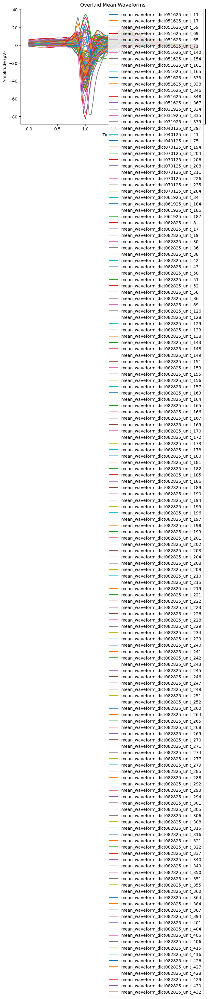

In [10]:
import matplotlib.pyplot as plt
import numpy as np

def plot_all_waveforms(mean_waveform_dict, sampling_rate=30000, exclude_units=None):
    """
    Plot all waveforms in mean_waveform_dict, excluding units if specified.
    
    Args:
        mean_waveform_dict: dict of {unit_id: waveform array}
        sampling_rate: sampling rate in Hz (default 30 kHz)
        exclude_units: list or set of unit IDs to skip
    """
    if exclude_units is None:
        exclude_units = set()
    else:
        exclude_units = set(exclude_units)  # ensure fast lookup
    
    plt.figure(figsize=(8, 5))
    
    for unit_id, waveform in mean_waveform_dict.items():
        if unit_id in exclude_units:
            continue  # skip excluded units

        # Pick best channel (largest peak-to-peak amplitude)
        best_channel = np.ptp(waveform, axis=0).argmax()
        wf = waveform[:, best_channel]

        # Convert x-axis to ms
        time_ms = np.arange(len(wf)) / sampling_rate * 1000

        # Plot waveform
        plt.plot(time_ms, wf, label=unit_id)

    plt.xlabel("Time (ms)")
    plt.ylabel("Amplitude (µV)")
    plt.title("Overlaid Mean Waveforms")
    plt.legend()
    plt.show()

# Example usage: exclude unit_29 and unit_41
plot_all_waveforms(mean_waveform_dict, exclude_units=["mean_waveform_dict082825_unit_23","mean_waveform_dict082825_unit_433","mean_waveform_dict082825_unit_431"])


C:\Users\rache\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


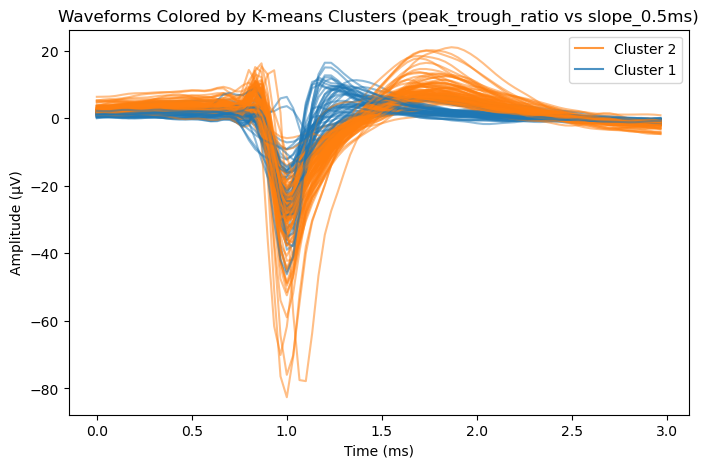

{'mean_waveform_dict051625_unit_11': 'Cluster 2', 'mean_waveform_dict051625_unit_17': 'Cluster 2', 'mean_waveform_dict051625_unit_59': 'Cluster 1', 'mean_waveform_dict051625_unit_69': 'Cluster 1', 'mean_waveform_dict051625_unit_65': 'Cluster 1', 'mean_waveform_dict051625_unit_71': 'Cluster 1', 'mean_waveform_dict051625_unit_140': 'Cluster 2', 'mean_waveform_dict051625_unit_154': 'Cluster 1', 'mean_waveform_dict051625_unit_161': 'Cluster 1', 'mean_waveform_dict051625_unit_165': 'Cluster 2', 'mean_waveform_dict051625_unit_333': 'Cluster 2', 'mean_waveform_dict051625_unit_338': 'Cluster 2', 'mean_waveform_dict051625_unit_346': 'Cluster 2', 'mean_waveform_dict051625_unit_348': 'Cluster 2', 'mean_waveform_dict051625_unit_367': 'Cluster 2', 'mean_waveform_dict031925_unit_334': 'Cluster 2', 'mean_waveform_dict031925_unit_335': 'Cluster 2', 'mean_waveform_dict031925_unit_339': 'Cluster 2', 'mean_waveform_dict040125_unit_29': 'Cluster 1', 'mean_waveform_dict040125_unit_41': 'Cluster 1', 'mean_w

In [11]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.cluster import KMeans

def plot_waveforms_by_cluster(mean_waveform_dict, features, x_feature, y_feature, sampling_rate=30000, exclude_units=None):
    """
    mean_waveform_dict: dict of waveforms {unit_id: waveform_array}
    features: dict {unit_id: {feature_name: value, ...}}
    x_feature, y_feature: feature names to use for clustering
    exclude_units: list or set of unit IDs to exclude
    """
    if exclude_units is None:
        exclude_units = set()
    else:
        exclude_units = set(exclude_units)

    # Filter units
    unit_ids = [uid for uid in features.keys() if uid not in exclude_units]
    X = np.array([[features[uid][x_feature], features[uid][y_feature]] for uid in unit_ids])

    # K-means clustering
    kmeans = KMeans(n_clusters=2, random_state=0, n_init=10).fit(X)
    labels = kmeans.labels_

    # Plot waveforms with cluster colors
    plt.figure(figsize=(8, 5))
    colors = ['tab:blue', 'tab:orange']
    cluster_plotted = [False, False]  # track whether label already added

    for uid, label in zip(unit_ids, labels):
        waveform = mean_waveform_dict[uid]
        best_channel = np.ptp(waveform, axis=0).argmax()
        wf = waveform[:, best_channel]
        time_ms = np.arange(len(wf)) / sampling_rate * 1000

        # Only label first waveform of each cluster
        if not cluster_plotted[label]:
            plt.plot(time_ms, wf, color=colors[label], alpha=0.8, label=f"Cluster {label+1}")
            cluster_plotted[label] = True
        else:
            plt.plot(time_ms, wf, color=colors[label], alpha=0.5)

    plt.xlabel("Time (ms)")
    plt.ylabel("Amplitude (µV)")
    plt.title(f"Waveforms Colored by K-means Clusters ({x_feature} vs {y_feature})")
    plt.legend()
    plt.show()

    # Return cluster assignments for reuse
    return {uid: f"Cluster {label+1}" for uid, label in zip(unit_ids, labels)}


# Example usage: exclude unit_29 and unit_41
cluster_assignments = plot_waveforms_by_cluster(
    mean_waveform_dict,
    features,
    "peak_trough_ratio",
    "slope_0.5ms",
    exclude_units=["mean_waveform_dict082825_unit_23","mean_waveform_dict082825_unit_433","mean_waveform_dict082825_unit_431","mean_waveform_dict082825_unit_30","mean_waveform_dict082825_unit_36","mean_waveform_dict082825_unit_51","mean_waveform_dict082825_unit_52","mean_waveform_dict082825_unit_58","mean_waveform_dict082825_unit_86","mean_waveform_dict082825_unit_86","mean_waveform_dict082825_unit_89","mean_waveform_dict082825_unit_190","mean_waveform_dict082825_unit_229","mean_waveform_dict082825_unit_239","mean_waveform_dict082825_unit_274","mean_waveform_dict082825_unit_305","mean_waveform_dict082825_unit_315","mean_waveform_dict082825_unit_316","mean_waveform_dict082825_unit_321","mean_waveform_dict082825_unit_340","mean_waveform_dict082825_unit_350","mean_waveform_dict082825_unit_426","mean_waveform_dict082825_unit_427","mean_waveform_dict082825_unit_428","mean_waveform_dict082825_unit_429","mean_waveform_dict082825_unit_430"]
)

print(cluster_assignments)
